In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tangent_boundaries as tb
from math import pi
from scipy.sparse import csr_matrix, csc_matrix, linalg as sla

sigma_0 = np.array([[1,0],[0,1]])
sigma_x = np.array([[0,1],[1,0]])
sigma_y = np.array([[0,-1j],[1j,0]])
sigma_z = np.array([[1,0],[0,-1]])

## Solve the generalised eigenvalue problem for the desired boundary conditions in a square geometry.

In [18]:
thetas = [0,1,2,3,4,5,6,7,8,9,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]

i = -1 ### selected value of theta
Nx = 41
Ny = 41
nbands = int((Nx*Ny)/100*16)
print('Bands to calculate: ',nbands)


parameters = dict(
    Nx = Nx,
    Ny = Ny,
    B1 = 0, # no magnetic field
    N1 = 0, #
    d1 = 0, # These are irrelevant for B1 = 0
    N2 = 0, #
    potential = lambda x,y:0.0*np.random.rand(Ny,Nx),
    mass = lambda x,y:0*x,
    disorder = 0,
    theta = -(pi/2)*(thetas[i]/100),
)

Bands to calculate:  268


In [19]:
ener, states, degenerate_indices = tb.solve_eigenproblem_square(parameters, number_of_bands = nbands)

/tmp/ipykernel_7699/3807811563.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/tmp/ipykernel_7699/3807811563.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize = (3,3))


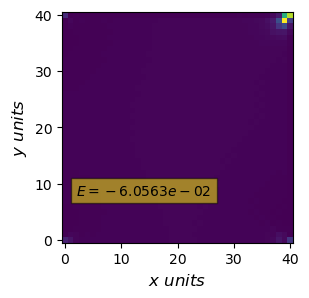

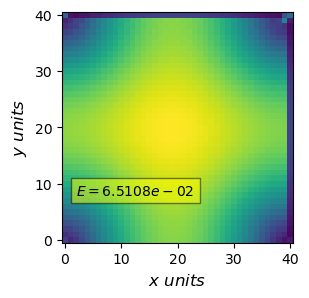

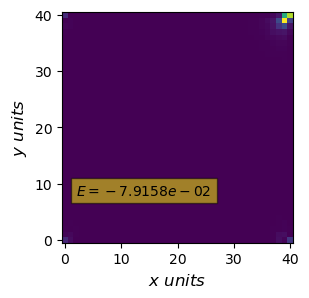

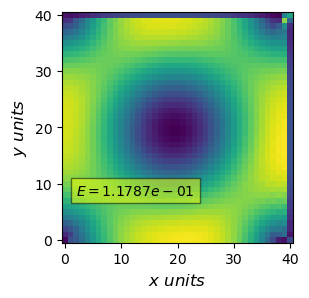

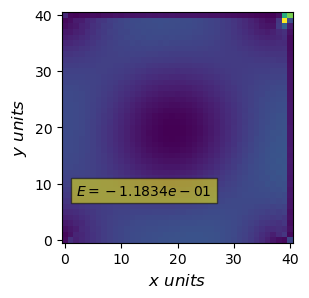

...

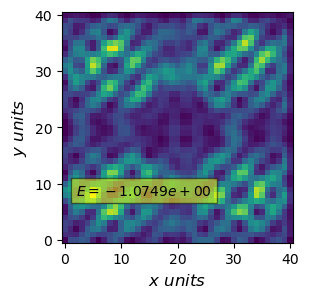

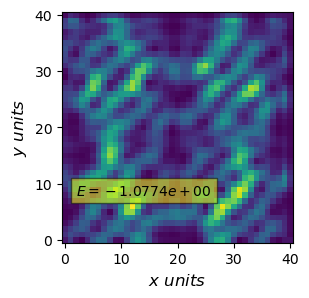

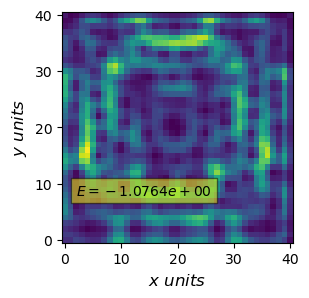

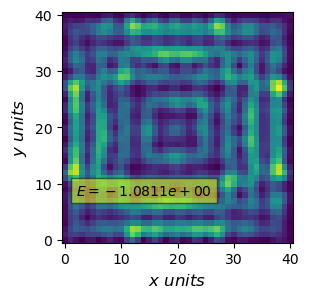

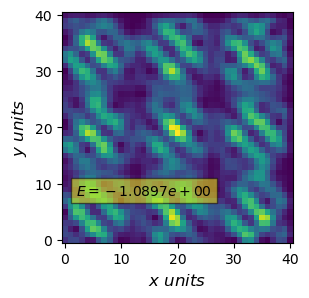

In [20]:
for i in range(nbands):
    to_plot = states[i,:,:,:]

    fig = plt.figure(figsize = (3,3))
    ax = fig.add_subplot(111)
    
    ax.imshow(np.sum(np.abs(to_plot)**2,axis = 0),vmin = 0, origin = 'lower')
    #ax.imshow(np.abs(to_plot[1])**2,vmin = 0,cmap = 'cividis') This would plot only spin down probability density
    formatted_number = f"{ener[i]:.4e}"
    plt.text(2, 8,rf'$E ={formatted_number}$' , fontsize=10, bbox=dict(facecolor='yellow', alpha=0.5))
    
    ax.set_ylabel(r"$y$ $units$",fontsize = 12)
    ax.set_xlabel(r"$x$ $units$",fontsize = 12)
    
    
    fig.show()

(-150.0, 150.0)

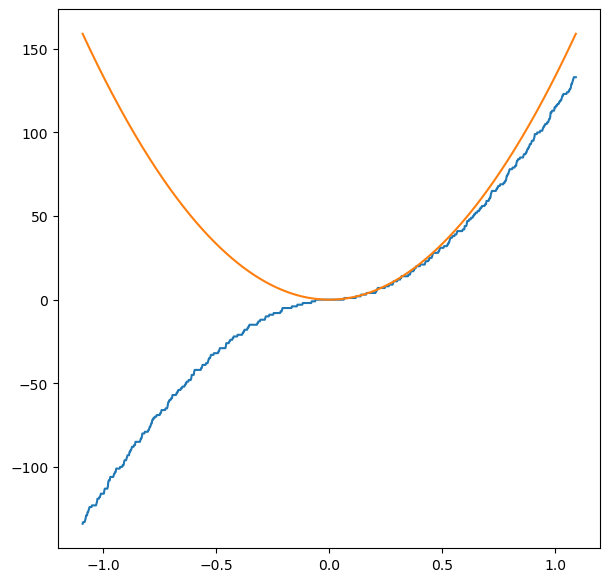

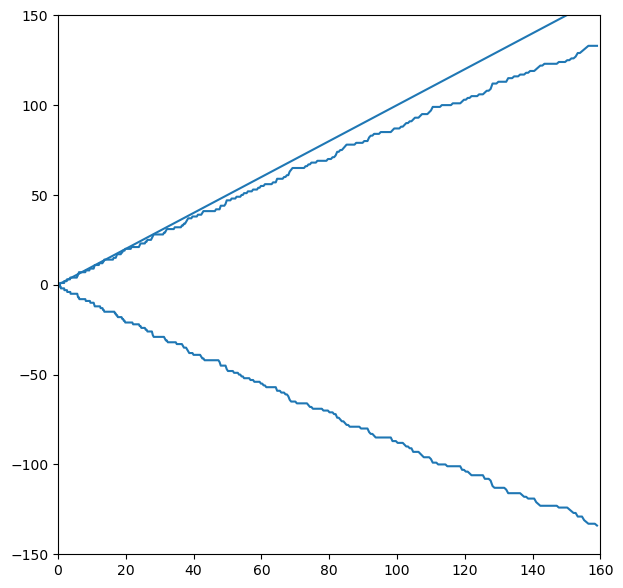

In [21]:
def staircase_function(energy, ener):
    '''Staircase function.'''
    return np.where(np.sort(np.append(ener, energy)) == energy)[0][0]

energies = np.linspace(-max(ener), max(ener),1000)
staircase = np.zeros(len(energies))
for i, e in enumerate(energies):
    staircase[i] = staircase_function(e,ener)

fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(111)
ax.plot(energies, staircase-staircase[len(staircase)//2]*np.ones(len(staircase)))
ax.plot(energies, parameters['Nx']*parameters['Ny']*energies**2/4/pi)
# ax.axhline(0)
# ax.axhline(0)
# ax.set_xlim(-0.25,0.25)
# ax.set_ylim(-25,25)

fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(111)
ax.plot(parameters['Nx']*parameters['Ny']*energies**2/4/pi, staircase-staircase[len(staircase)//2]*np.ones(len(staircase)))
ax.axline((0,0), slope = 1)
ax.set_xlim(0,160)
ax.set_ylim(-150,150)

# Let us do level spacing ratios statistics

(0.0, 1.0)

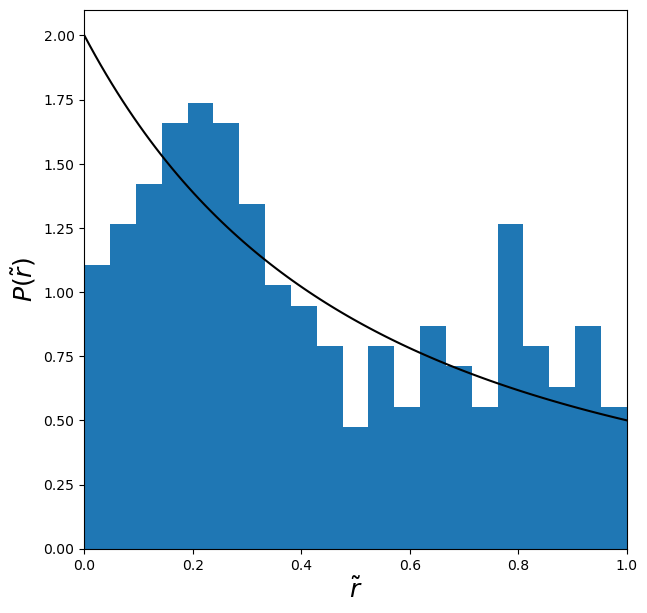

In [22]:
def spacing_ratios_distribution(spectrum, nbins = 41):
    
    spacings = (np.sort(spectrum)-np.roll(np.sort(spectrum),1))[1:]
    ratios = (spacings/np.roll(spacings,1))[1:]
    ratios = np.where(ratios<1, ratios, 1/ratios)
    histogram, bin_edges = np.histogram(ratios, range = (0,1), bins = nbins, density = True )
    
    return histogram, bin_edges

nbins_spacing = 21
ratios_distribution_square, bin_edges_square = spacing_ratios_distribution(ener, nbins = nbins_spacing)

x_square = (bin_edges_square[1:]+bin_edges_square[:-1])/2
dx_square = (bin_edges_square[1]-bin_edges_square[0])
x_analytical = np.linspace(0,1,100)
analytical_poisson = 2/(1+x_analytical)**2

fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(111)
ax.bar(x_square,ratios_distribution_square,width = dx_square)
ax.plot(x_analytical,analytical_poisson, c = 'k')
ax.set_ylabel(r"$P(\tilde{r})$",fontsize = 18)
ax.set_xlabel(r"$\tilde{r}$",fontsize = 18)
ax.set_xlim(0,1)


## Let us calculate the bands for a ribbon of the same width as the square and compare them with our spectrum

In [5]:
parameters['Nx'] = 1 #Assume translational invariance in x direction
nbands = int(Ny)
npoints = 101
kmin = -pi
kmax = pi
parameters['ky'] = 0

momenta,bands = tb.make_bands_x(parameters, number_of_bands = nbands,number_of_points = npoints, kmin = -3, kmax = 3)

/tmp/ipykernel_25783/560679792.py:12: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


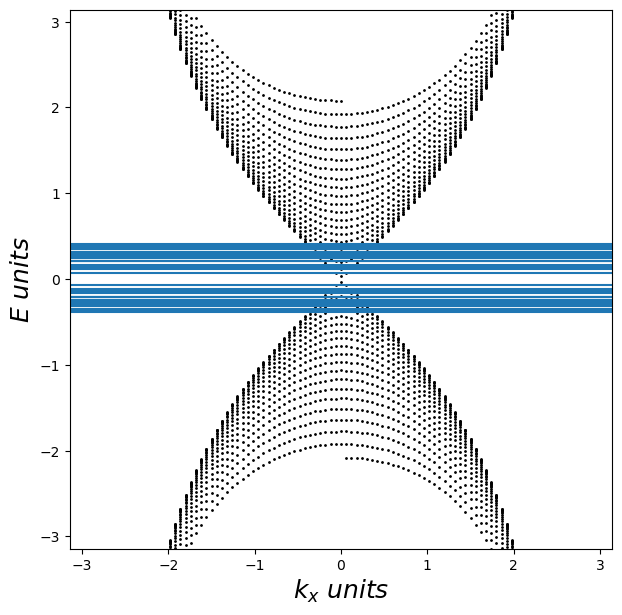

In [6]:
fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(111)

for b in range(nbands):
    ax.scatter(momenta,bands[:,b], s = 1, c = 'k')
    ax.axhline(ener[b])
ax.set_xlabel(r"$k_x$ $units$",fontsize = 18)
ax.set_ylabel(r"$E$ $units$",fontsize = 18)
ax.set_xlim(-pi,pi)
ax.set_ylim(-pi,pi)

fig.show()

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import tangent_boundaries as tb
from math import pi

path = '/home/donisvelaa/data1/tangent-boundaries/'

thetas = [0,1,2,3,4,5,6,7,8,9,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]

i = 18 ### selected value of theta
Nx = 45
Ny = 45
nbands = int((Nx*Ny)/100*16)
#nbands = 300
print('Bands to calculate: ',nbands)

parameters = dict(
    Nx = Nx,
    Ny = Ny,
    B1 = 0, # no magnetic field
    N1 = 0, #
    d1 = 0, # These are irrelevant for B1 = 0
    N2 = 0, #
    potential = lambda x,y:0.0*np.random.rand(Ny,Nx),
    mass = lambda x,y:0*x,
    disorder = 0,
    theta = -(pi/2)*(thetas[i]/100),
)

################## SQUARE
parameters['Nx'] =  int(np.round(np.sqrt(pi*Nx*Ny/4))) # We want the square to have the same area as the ellipse
parameters['Ny'] =  int(np.round(np.sqrt(pi*Nx*Ny/4)))

print('Solving square')
print('theta/(pi/2) = ', thetas[i])
print('Nx = ', parameters['Nx'])
print('Ny = ', parameters['Ny'])

spectrum_square, states_square, degenerate_indices_square = tb.solve_eigenproblem_square(parameters, number_of_bands = nbands)

# print('Saving square spectrum')
# name = 'square_spectrum'
# np.save(path+name+'_Nx'+str(parameters['Nx'])+'_Ny'+str(parameters['Ny'])+'_theta'+str(thetas[i])+'_nbands'+str(nbands), spectrum_square, allow_pickle=True)
# print('Saving square spectrum')
# name = 'square_states'
# np.save(path+name+'_Nx'+str(parameters['Nx'])+'_Ny'+str(parameters['Ny'])+'_theta'+str(thetas[i])+'_nbands'+str(nbands), states_square, allow_pickle=True)


Bands to calculate:  324
Solving square
theta/(pi/2) =  50
Nx =  40
Ny =  40


/tmp/ipykernel_7699/803938210.py:34: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/tmp/ipykernel_7699/803938210.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize = (3,3))


(0.0, 1.0)

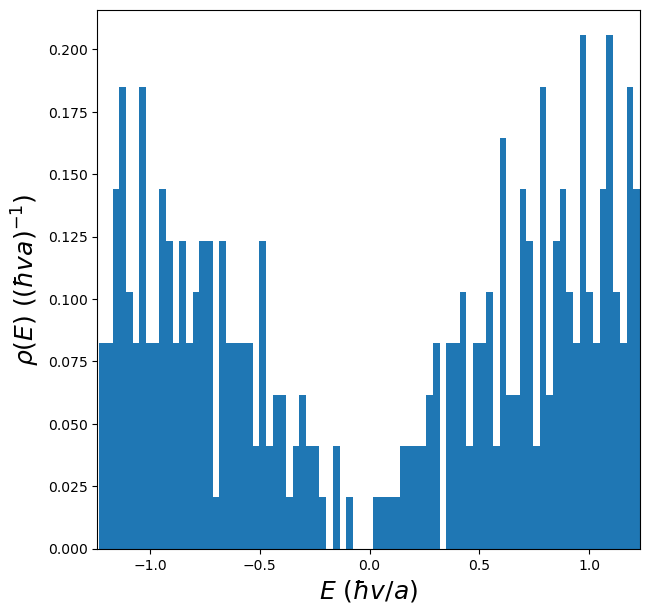

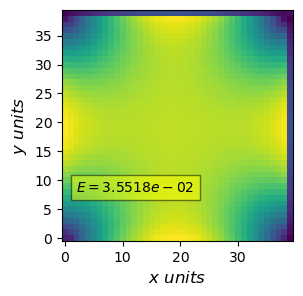

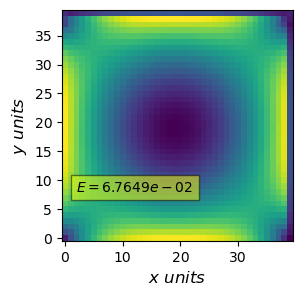

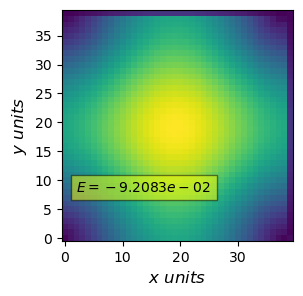

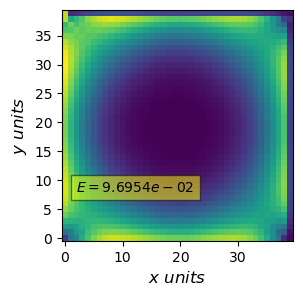

...

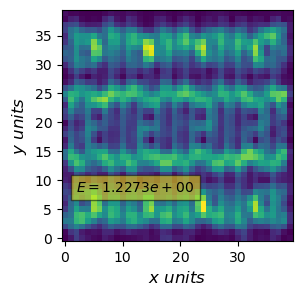

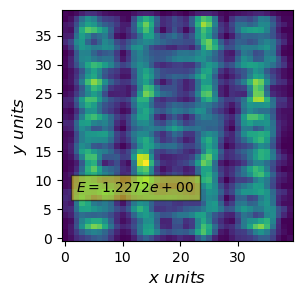

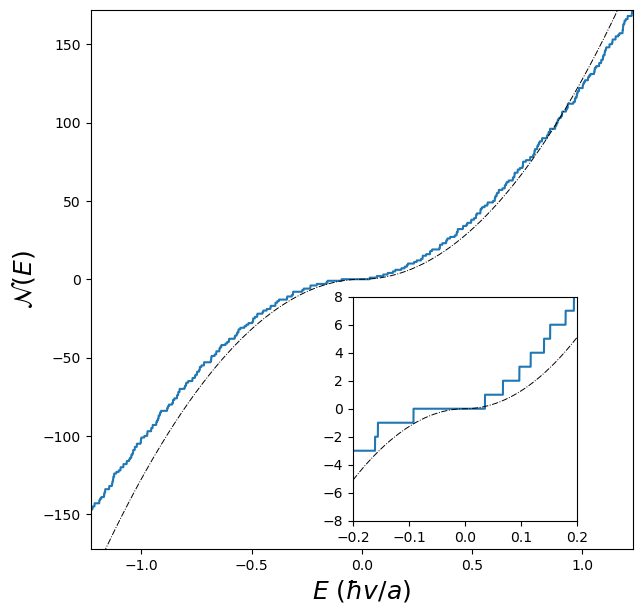

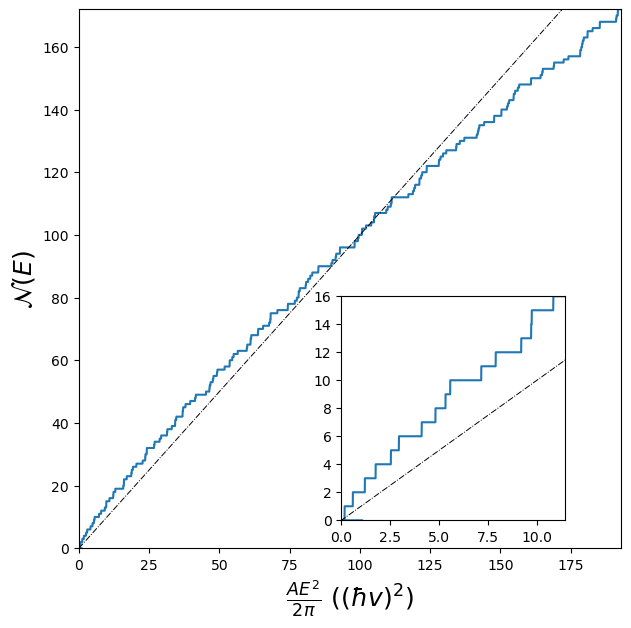

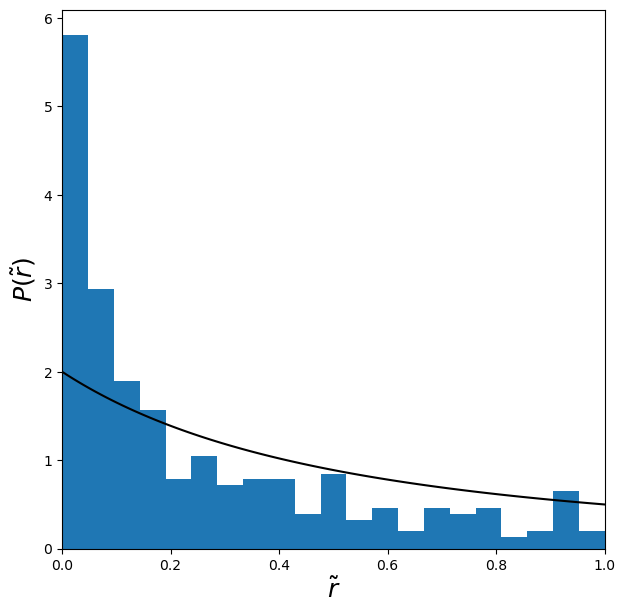

In [44]:
nbins = 81
square_DOS, bin_edges_square_DOS = np.histogram(spectrum_square, bins = nbins, range = (-max(spectrum_square),max(spectrum_square)), density = False)

area_square = parameters['Nx']*parameters['Ny']
x = (bin_edges_square_DOS[1:]+bin_edges_square_DOS[:-1])/2
dx = (bin_edges_square_DOS[1]-bin_edges_square_DOS[0])

fig_square_DOS = plt.figure(figsize = (7,7))
ax_square_DOS = fig_square_DOS.add_subplot(111)
ax_square_DOS.bar(x,square_DOS/dx/area_square,width = dx)
ax_square_DOS.set_ylabel(r"$\rho(E)$ ($(\hbar v a)^{-1}$)",fontsize = 18)
ax_square_DOS.set_xlabel(r"$E$ ($\hbar v/a$)",fontsize = 18)
ax_square_DOS.set_xlim(min(spectrum_square),max(spectrum_square))

#fig_square_DOS.savefig('square_DOS.pdf')



for i in range(nbands):
    to_plot = states_square[i,:,:,:]

    fig = plt.figure(figsize = (3,3))
    ax = fig.add_subplot(111)
    
    ax.imshow(np.sum(np.abs(to_plot)**2,axis = 0),vmin = 0, origin = 'lower')
    #ax.imshow(np.abs(to_plot[1])**2,vmin = 0,cmap = 'cividis') This would plot only spin down probability density
    formatted_number = f"{spectrum_square[i]:.4e}"
    plt.text(2, 8,rf'$E ={formatted_number}$' , fontsize=10, bbox=dict(facecolor='yellow', alpha=0.5))
    
    ax.set_ylabel(r"$y$ $units$",fontsize = 12)
    ax.set_xlabel(r"$x$ $units$",fontsize = 12)
    
    
    fig.show()


def staircase_function(energy, spectrum, nbins = 41):
    '''Staircase function.'''
    return np.where(np.sort(np.append(spectrum, energy))==energy)[0][0]

energies_square = np.linspace(-max(spectrum_square), max(spectrum_square),10000)
#energies_square = np.linspace(-0.3, 0.3,1000)
staircase_square = np.zeros(len(energies_square))
for i, e in enumerate(energies_square):
    staircase_square[i] = staircase_function(e,spectrum_square)

fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(111)
ax.plot(energies_square, staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square)))
ax.plot(energies_square, energies_square/np.abs(energies_square)*area_square*energies_square**2/4/pi, ls = '-.', c = 'k',lw = 0.7)
ax.set_ylabel(r"$\mathcal{N}(E)$",fontsize = 18)
ax.set_xlabel(r"$E$ ($\hbar v/a$)",fontsize = 18)
ax.set_ylim(-max(staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square))),max(staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square))))
ax.set_xlim(-max(energies_square),max(energies_square))

energies_square = np.linspace(-0.2, 0.2,10000)
staircase_square = np.zeros(len(energies_square))
for i, e in enumerate(energies_square):
    staircase_square[i] = staircase_function(e,spectrum_square)

left, bottom, width, height = [0.5, 0.15, 0.32, 0.32]
ax2 = fig.add_axes([left, bottom, width, height])
ax2.plot(energies_square, staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square)))
ax2.plot(energies_square, energies_square/np.abs(energies_square)*area_square*energies_square**2/4/pi, ls = '-.', c = 'k',lw = 0.7)

ax2.set_ylim(-max(staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square))),max(staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square))))
ax2.set_xlim(-max(energies_square),max(energies_square))
#fig.savefig('square_staircase.pdf')


energies_square = np.linspace(-max(spectrum_square), max(spectrum_square),10000)
#energies_square = np.linspace(-0.3, 0.3,1000)
staircase_square = np.zeros(len(energies_square))
for i, e in enumerate(energies_square):
    staircase_square[i] = staircase_function(e,spectrum_square)


fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(111)
ax.plot(area_square*energies_square**2/4/pi, staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square)))
ax.set_ylabel(r"$\mathcal{N}(E)$",fontsize = 18)
ax.set_xlabel(r"$\frac{A E^2}{2\pi}$ ($(\hbar v)^2$)",fontsize = 18)
ax.axline((0,0), slope = 1, ls = '-.', c = 'k',lw = 0.7)
ax.set_ylim(0,max(staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square))))
ax.set_xlim(0,max(area_square*energies_square**2/4/pi))


energies_square = np.linspace(-0.3, 0.3,10000)
staircase_square = np.zeros(len(energies_square))
for i, e in enumerate(energies_square):
    staircase_square[i] = staircase_function(e,spectrum_square)

left, bottom, width, height = [0.5, 0.15, 0.32, 0.32]
ax2 = fig.add_axes([left, bottom, width, height])
ax2.plot(area_square*energies_square**2/4/pi, staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square)))
ax2.plot(area_square*energies_square**2/4/pi, energies_square/np.abs(energies_square)*area_square*energies_square**2/4/pi, ls = '-.', c = 'k',lw = 0.7)

ax2.set_ylim(0,max(staircase_square -staircase_square[len(staircase_square)//2]*np.ones(len(staircase_square))))
ax2.set_xlim(0,max(area_square*energies_square**2/4/pi))
#fig.savefig('square_staircase_unfolded.pdf')


def spacing_ratios_distribution(spectrum, nbins = 41):
    
    spacings = (np.sort(spectrum)-np.roll(np.sort(spectrum),1))[1:]
    ratios = (spacings/np.roll(spacings,1))[1:]
    ratios = np.where(ratios<1, ratios, 1/ratios)
    histogram, bin_edges = np.histogram(ratios, range = (0,1), bins = nbins, density = True )
    
    return histogram, bin_edges

nbins_spacing = 21
ratios_distribution_square, bin_edges_square = spacing_ratios_distribution(spectrum_square, nbins = nbins_spacing)

x_square = (bin_edges_square[1:]+bin_edges_square[:-1])/2
dx_square = (bin_edges_square[1]-bin_edges_square[0])
x_analytical = np.linspace(0,1,100)
analytical_poisson = 2/(1+x_analytical)**2

fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(111)
ax.bar(x_square,ratios_distribution_square,width = dx_square)
ax.plot(x_analytical,analytical_poisson, c = 'k')
ax.set_ylabel(r"$P(\tilde{r})$",fontsize = 18)
ax.set_xlabel(r"$\tilde{r}$",fontsize = 18)
ax.set_xlim(0,1)
#fig.savefig('square_spacings.pdf')